In [1]:
library('Seurat')
library('dplyr')
library('patchwork')
library('ggplot2')
#options(repr.plot.width = NULL, repr.plot.height = NULL) use this code to change plot size; NULL resets back to default

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
# Load the PBMC dataset
pbmc.data <- Read10X("/Users/rvi33352/Documents/sc RNA seq analysis/python scripts/PhexWT_1_Seurat_10x")
# Initialize the Seurat object with the raw (non-normalized data).
PhexWT_1 <- CreateSeuratObject(counts = pbmc.data, project = "PhexWT_1", min.cells = 3, min.features = 200)
PhexWT_1

An object of class Seurat 
19627 features across 9177 samples within 1 assay 
Active assay: RNA (19627 features, 0 variable features)
 1 layer present: counts

In [3]:
PhexWT_1[["percent.mt"]] <- PercentageFeatureSet(PhexWT_1, pattern = "^mt-")

Warning message:
“Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead.”


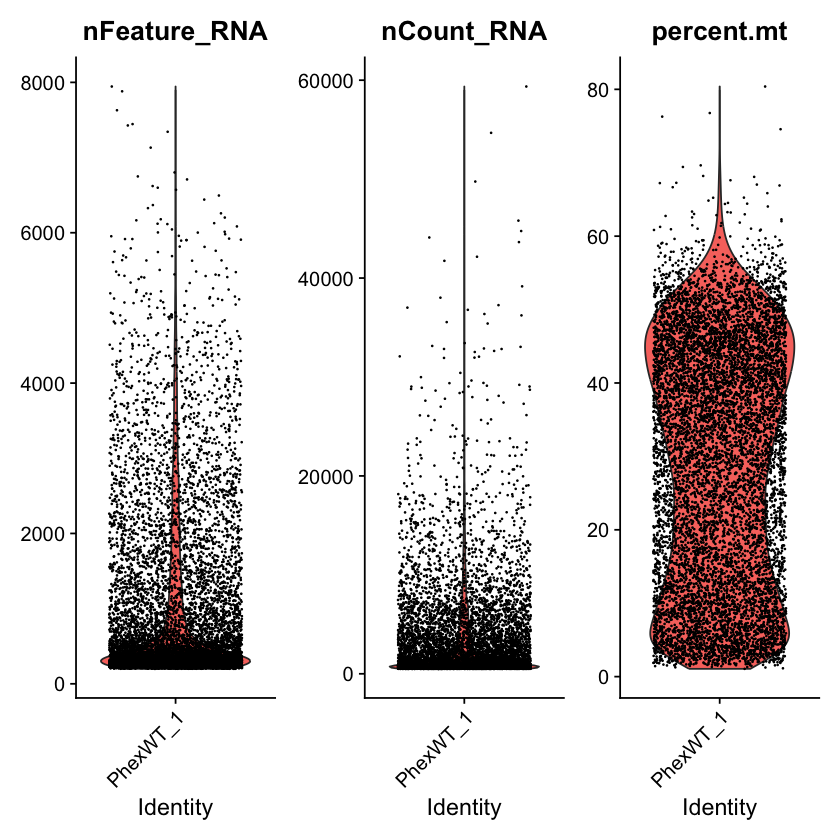

In [4]:
# Visualize QC metrics as a violin plot
VlnPlot(PhexWT_1, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)

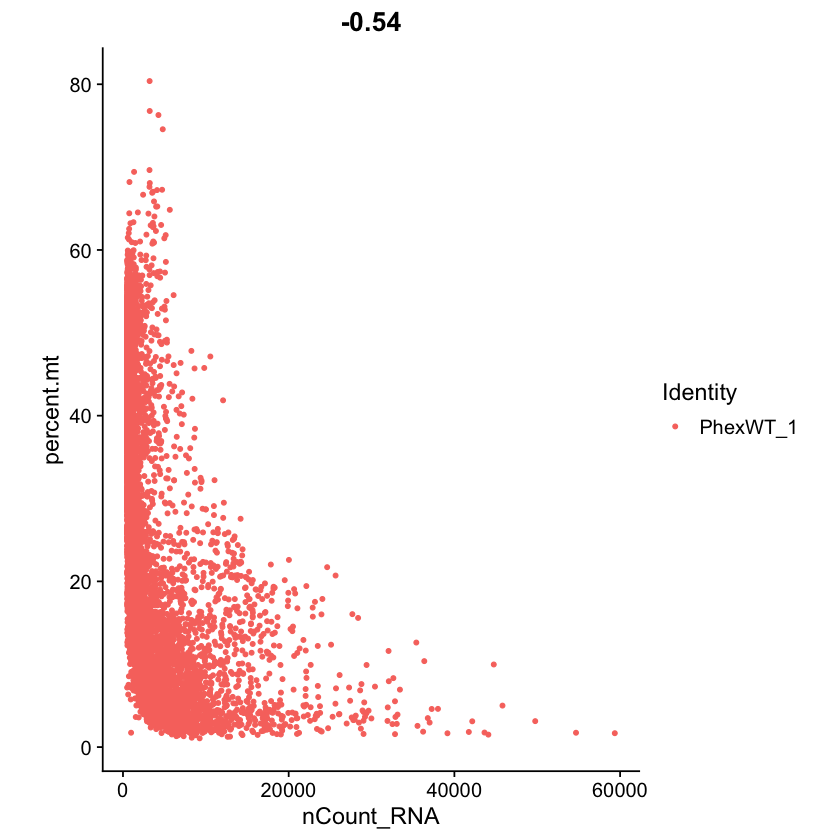

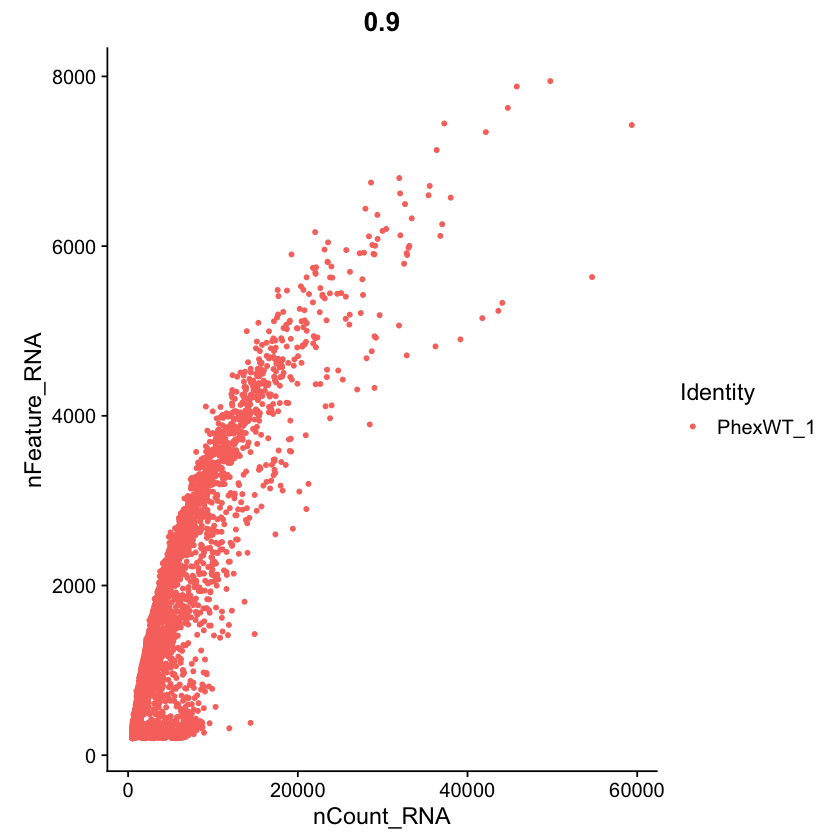

In [5]:
plot1 <- FeatureScatter(PhexWT_1, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(PhexWT_1, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + coord_fixed(ratio = 1000)
plot2 + coord_fixed(ratio = 10)

In [6]:
pbmc <- subset(PhexWT_1, subset = nFeature_RNA > 200 & nFeature_RNA < 2500)

In [7]:
PhexWT_1 <- NormalizeData(PhexWT_1, normalization.method = "LogNormalize", scale.factor = 10000)

Normalizing layer: counts



Finding variable features for layer counts

When using repel, set xnudge and ynudge to 0 for optimal results



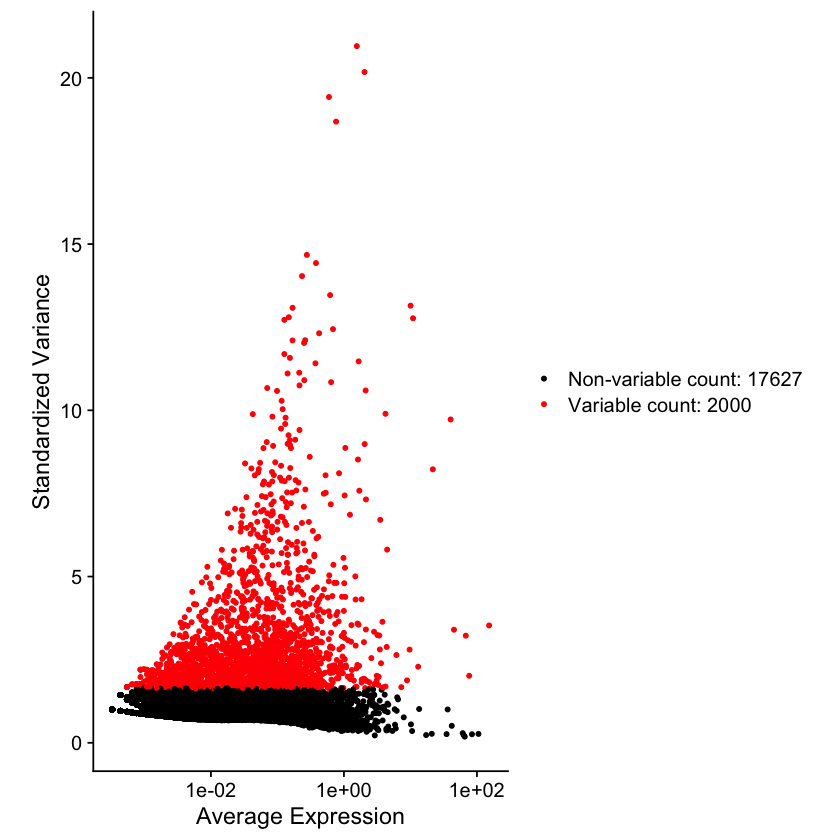

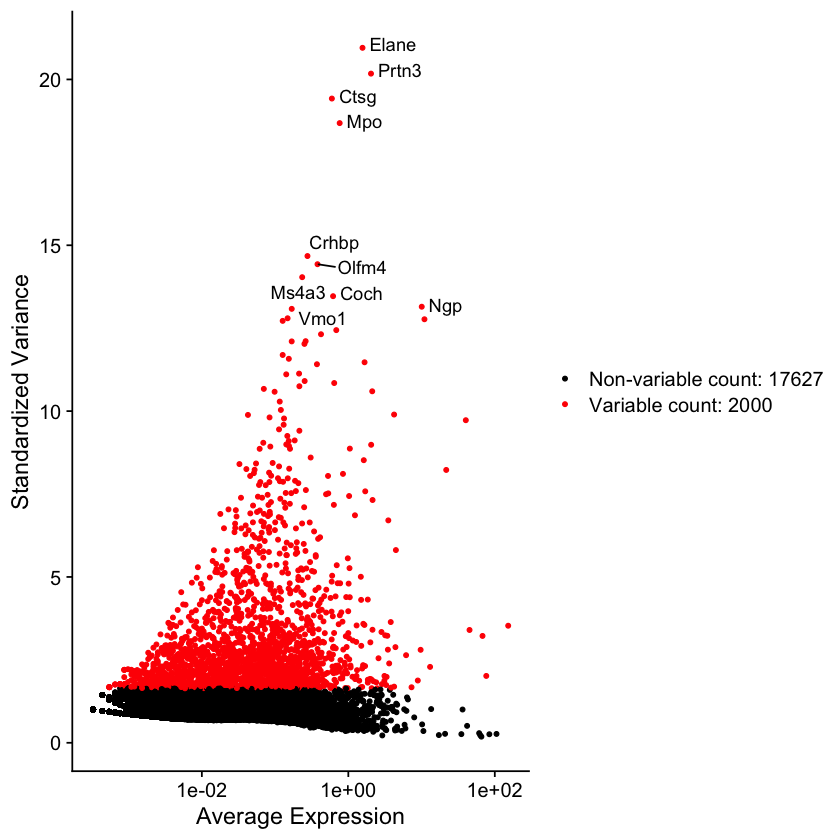

In [8]:
PhexWT_1 <- FindVariableFeatures(PhexWT_1, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(PhexWT_1), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(PhexWT_1)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 + coord_fixed(ratio = 0.5)
plot2

In [9]:
all.genes <- rownames(PhexWT_1)
PhexWT_1 <- ScaleData(PhexWT_1, features = all.genes)

Centering and scaling data matrix



In [10]:
PhexWT_1 <- RunPCA(PhexWT_1, features = VariableFeatures(object = PhexWT_1))

PC_ 1 
Positive:  Arhgdib, Rac2, Hmgb2, Arhgap15, Coro1a, Cd52, Srgn, Hp, Alox5ap, Gmfg 
	   Lcp1, Spi1, Ptprc, Ncf4, Plaur, Cybb, Fam107b, Lmnb1, Pglyrp1, Hmgn2 
	   Cebpb, Mir142hg, Wfdc21, Lyn, Mctp1, Cyrib, Ncf2, Samsn1, Cebpd, Trem3 
Negative:  Ptgds, Slc12a2, Spp1, Dclk1, Gas2, Dnase1, Igf1, Fbxo2, Ptn, Kcne1 
	   Plp1, Atp1b2, Lrp2, Rspo3, Ehd3, Nmnat2, Rgs4, Etnppl, Bglap3, Plce1 
	   Clstn1, Hs3st6, Esrrb, Lrpap1, Ank3, Pax3, Rnf152, Kcnq1, Spon1, Cldn9 
PC_ 2 
Positive:  S100a9, S100a8, Wfdc21, Pglyrp1, Lcn2, Hp, Hbb-bs, Cd177, Ly6g, Trem3 
	   Mcemp1, Ngp, Ifitm6, Hdc, Lrg1, Ltf, Camp, Mmp9, Cd52, Plaur 
	   Ltb4r1, Alox5ap, Ncf4, Mmp8, Rac2, F630028O10Rik, Retnlg, C5ar1, Itgam, Slfn4 
Negative:  Rgs6, Trpm3, Eya4, Cntn4, Kcnb2, Ptprk, Tmtc2, Phactr1, Nav3, Erbb4 
	   Epha7, Cavin2, Cntn3, Fosb, Emcn, Cxadr, Ebf2, Efemp1, Ccn1, Nr2f2 
	   Pdzrn3, Sgcd, Tshz2, Grid2, Hmcn1, Robo2, Rbms3, Tenm2, Ust, Arhgap28 
PC_ 3 
Positive:  Mmp9, Ly6g, Mmp8, Retnlg, Wfdc21, Ifitm6, Pglyrp1

In [11]:
# Examine and visualize PCA results a few different ways
print(PhexWT_1[["pca"]], dims = 1:5, nfeatures = 5)

PC_ 1 
Positive:  Arhgdib, Rac2, Hmgb2, Arhgap15, Coro1a 
Negative:  Ptgds, Slc12a2, Spp1, Dclk1, Gas2 
PC_ 2 
Positive:  S100a9, S100a8, Wfdc21, Pglyrp1, Lcn2 
Negative:  Rgs6, Trpm3, Eya4, Cntn4, Kcnb2 
PC_ 3 
Positive:  Mmp9, Ly6g, Mmp8, Retnlg, Wfdc21 
Negative:  Rhd, Mki67, Hemgn, Ank1, Tspan33 
PC_ 4 
Positive:  Kcnb2, Emcn, Nav3, Cntn3, Cavin2 
Negative:  Ank3, Bmpr1b, Shroom3, Lrp2, Ror1 
PC_ 5 
Positive:  Rhd, Gypa, Wfdc21, Lcn2, Ly6g 
Negative:  Ighm, Bach2, Blnk, Cd79a, Cd79b 


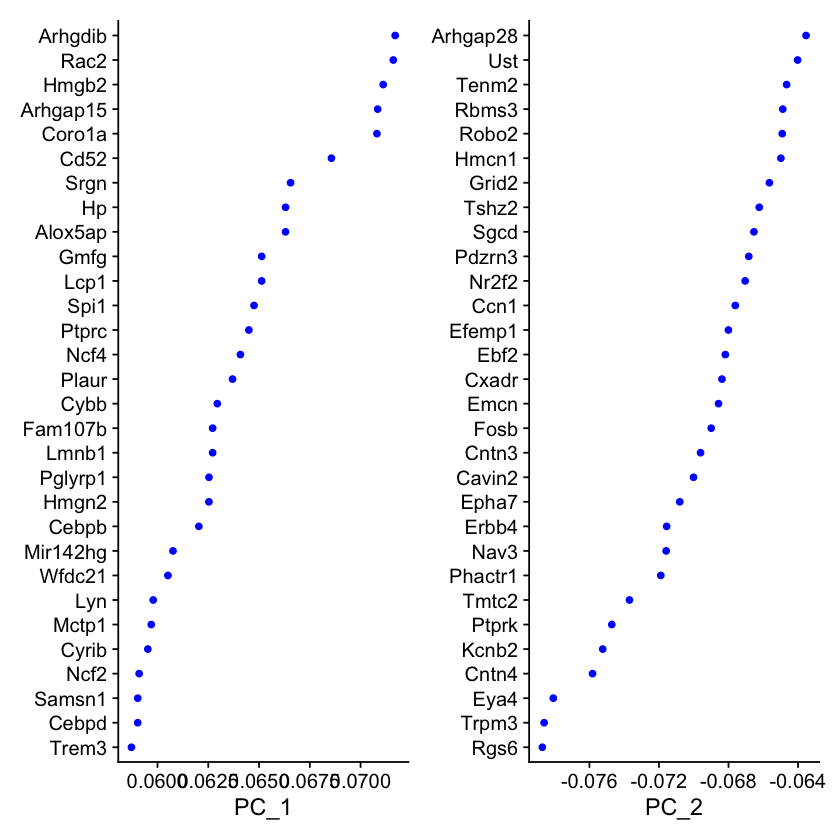

In [12]:
VizDimLoadings(PhexWT_1, dims = 1:2, reduction = "pca")

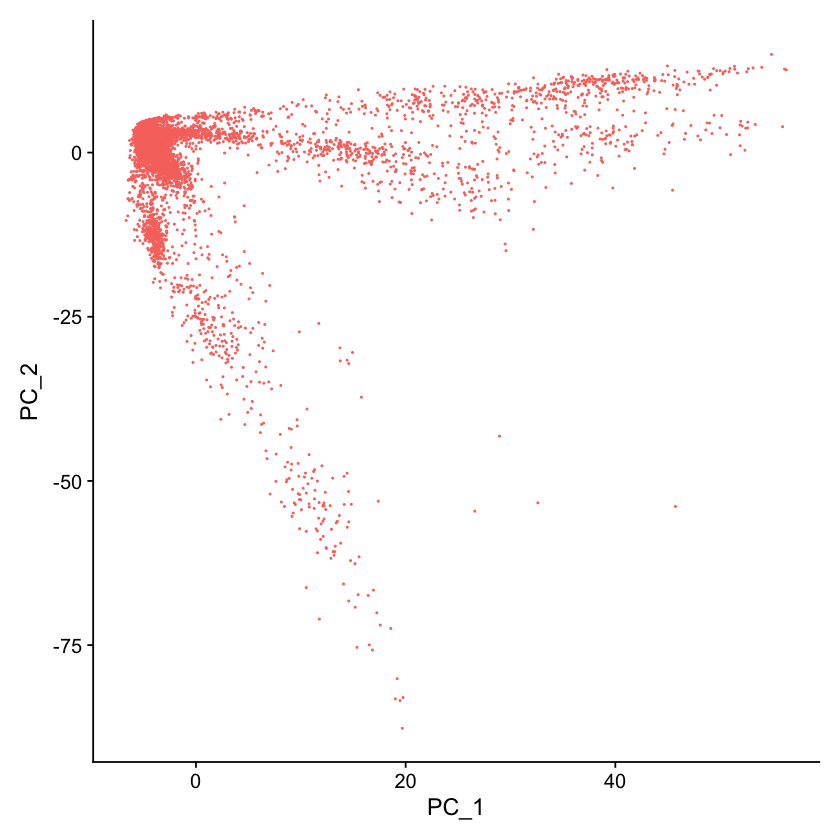

In [13]:
DimPlot(PhexWT_1, reduction = "pca") + NoLegend()

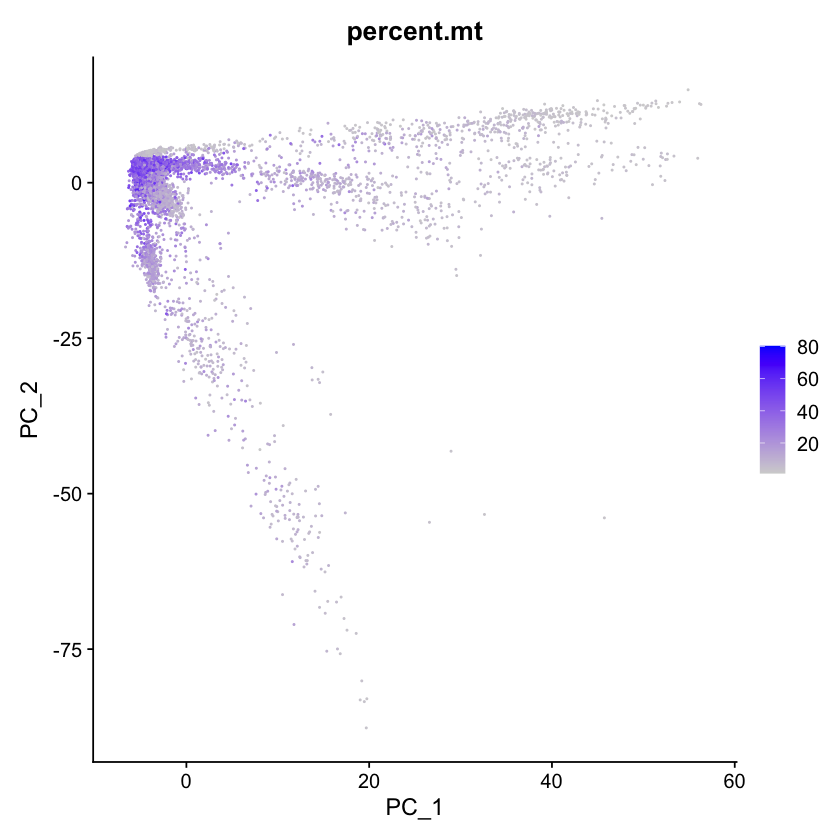

In [14]:
FeaturePlot(PhexWT_1, reduction = "pca", features = c("percent.mt"))

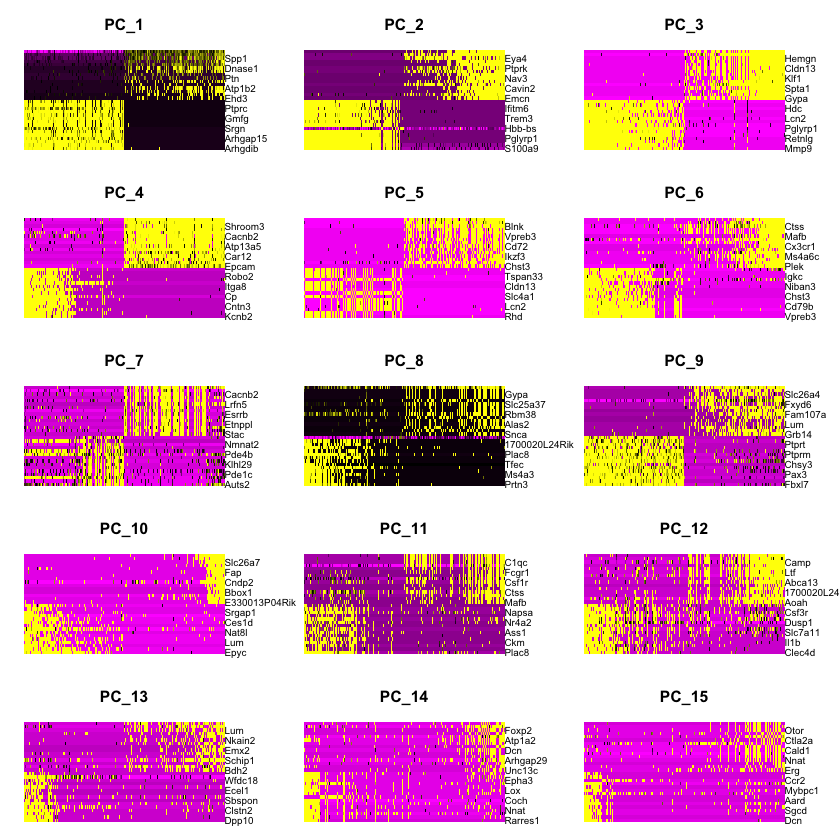

In [15]:
DimHeatmap(PhexWT_1, dims = 1:15, cells = 500, balanced = TRUE)

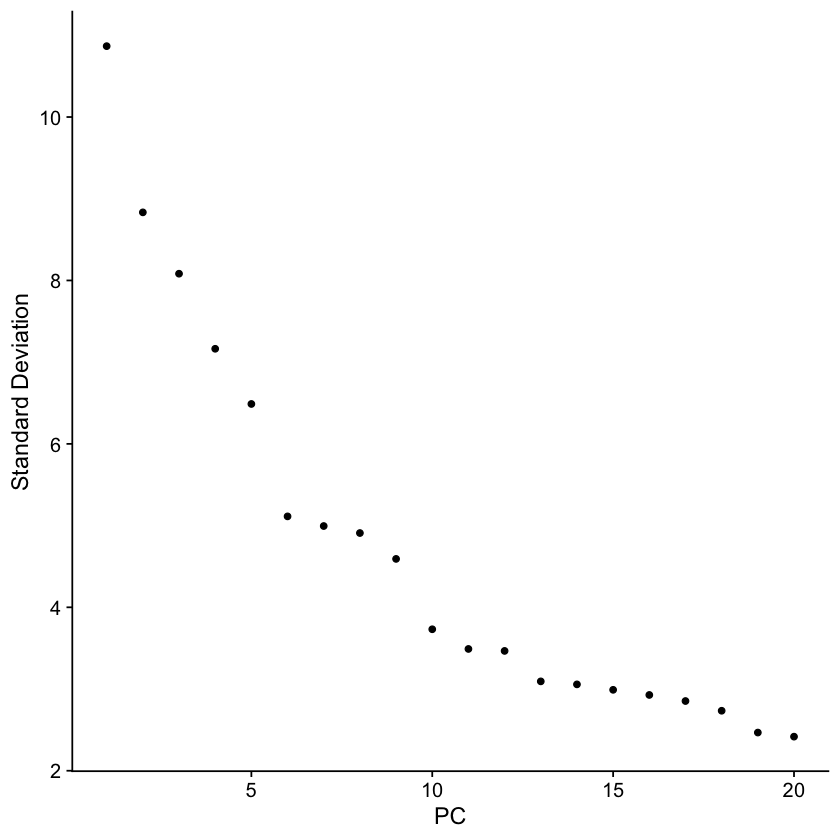

In [16]:
ElbowPlot(PhexWT_1)

In [17]:
PhexWT_1 <- FindNeighbors(PhexWT_1, dims = 1:20)
PhexWT_1 <- FindClusters(PhexWT_1, resolution = 0.5, algorithm = 4)

Computing nearest neighbor graph

Computing SNN

Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", module, "load", sep = "::"):
“NAs introduced by coercion to integer range”
Warning message in paste("reticulate", 

In [18]:
PhexWT_1 <- RunUMAP(PhexWT_1, dims = 1:10)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
12:42:30 UMAP embedding parameters a = 0.9922 b = 1.112

12:42:30 Read 9177 rows and found 10 numeric columns

12:42:30 Using Annoy for neighbor search, n_neighbors = 30

12:42:30 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:42:31 Writing NN index file to temp file /var/folders/hc/zpcxpzxn4595ny8kwvhby8m81lyslp/T//RtmpkP7onV/filed20c2ac3dd6f

12:42:31 Searching Annoy index using 1 thread, search_k = 3000

12:42:33 Annoy recall = 100%

12:42:33 Commencing smooth kNN distance calibrat

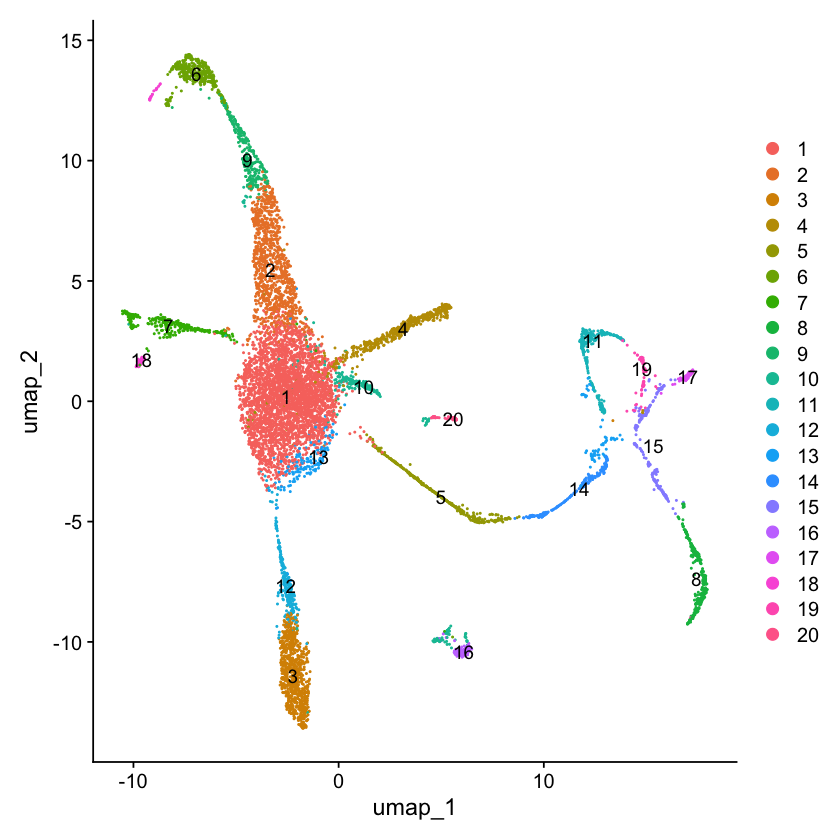

In [19]:
DimPlot(PhexWT_1, reduction = "umap", label = TRUE)

In [59]:
IC_genes <- c("Met", "Cd44", "Tyr")
MC_genes <- c("Kcnq1", "Kcne1")
BC_genes <- c("Cldn11", "Tjp1", "Atp6v0a4")
marker_genes <- c("Kcne1", "Kcnq1", "Atp1b2", "Slc12a2", "Kcnj10", "Met", "Ednrb", "Dct", "Pax3", "Cd44", "Nrp2", "Tyr", "Gjb2", "Cldn11", "Tjp1", "Atp6v0a4", "Slc26a4", "Anxa1", "Epyc", "Otos", "Car3", "Car2", "Slc12a2", "Gjb2", "Igfbp2",
                  "Esam", "Pecam1", "Rgs5", "Tagln", "Anxa1", "Myh11", "Cx3cr1", "Cd14", "Tcf7l2", "Lyn", "Mki67", "Nkg7", "Cd247", "Fcer1g", "Tyrobp", "Ms4a1", "Ighd", "Fcrl1", "Ighm", "Ms4a1", "Itgb1", "Col4a4", "Prdm1", "Irf4", "Pax5", 
                  "Bcl11a", "Blk", "Ighd", "Ighm", "Mzb1", "Hsp90b1", "Fndc3b", "Prdm1", "Igkc", "Jchain", "Xbp1", "Prdm1", "Pax5", "Cd4", "Il7r", "Trbc2", "Cd8a", "Gzma", "Ccl5", "Gzmb", "Lef1", "Ccr7", "Tcf7", "Stfa2l1", "Ly6g", "Vmo1", 
                  "Coch", "Emilin2", "Slc1a3", "Sox2", "Cdkn1b", "Otof", "Ocm", "Mpz", "Mbp", "Plp1", "Nefh", "Thy1", "Tubb3", "Hba-a1", "Hba-a2")

Picking joint bandwidth of 0.059

Picking joint bandwidth of 0.066

Picking joint bandwidth of 0.0383

Picking joint bandwidth of 0.0395

Picking joint bandwidth of 0.0518



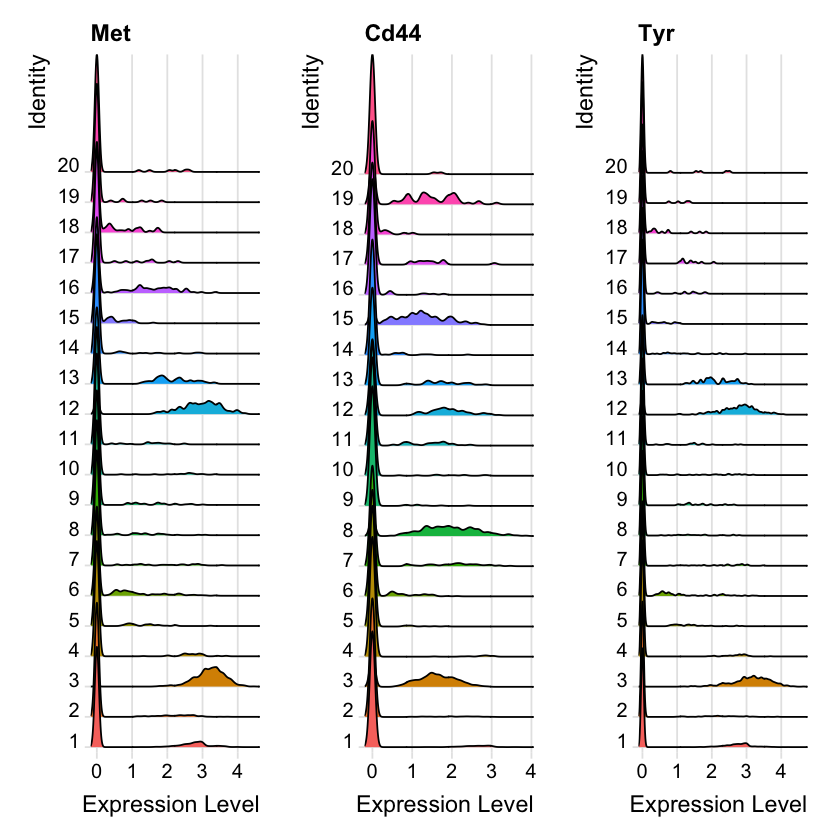

Picking joint bandwidth of 0.0418

Picking joint bandwidth of 0.044

Picking joint bandwidth of 2.94e-06



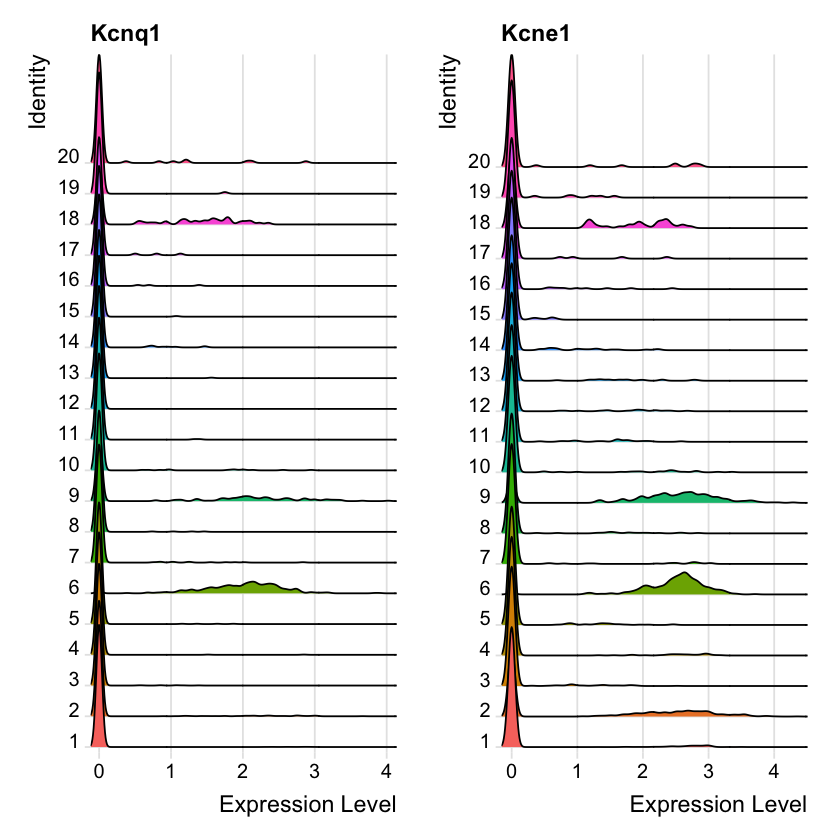

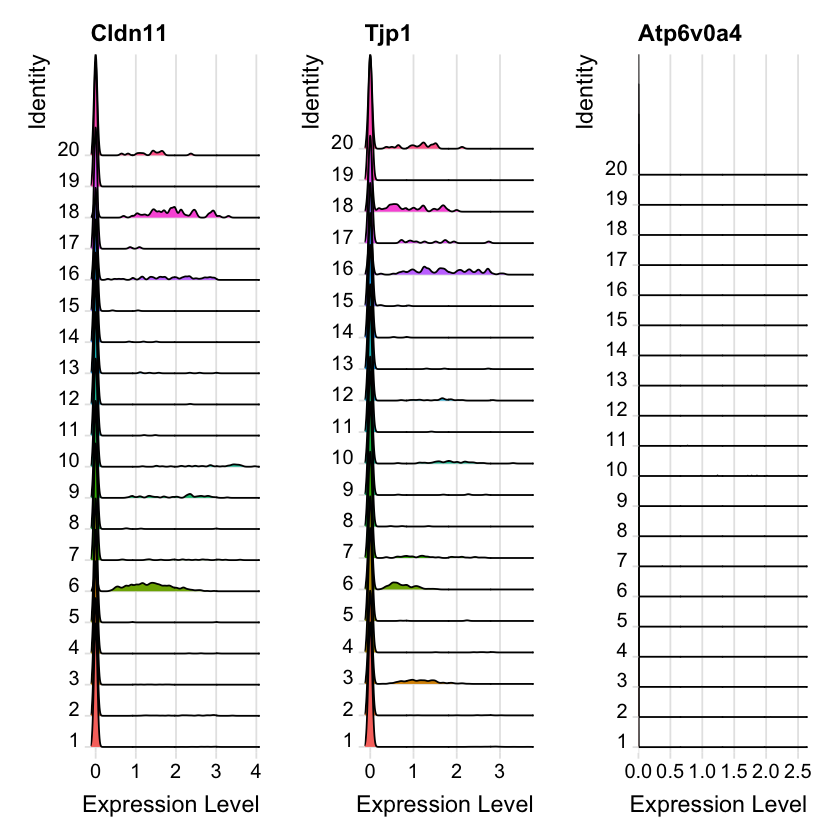

In [21]:
Plot1 <- RidgePlot(PhexWT_1, features = IC_genes, ncol = 3)
Plot2 <- RidgePlot(PhexWT_1, features = MC_genes, ncol = 2)
Plot3 <- RidgePlot(PhexWT_1, features = BC_genes, ncol = 3)
Plot1
Plot2
Plot3

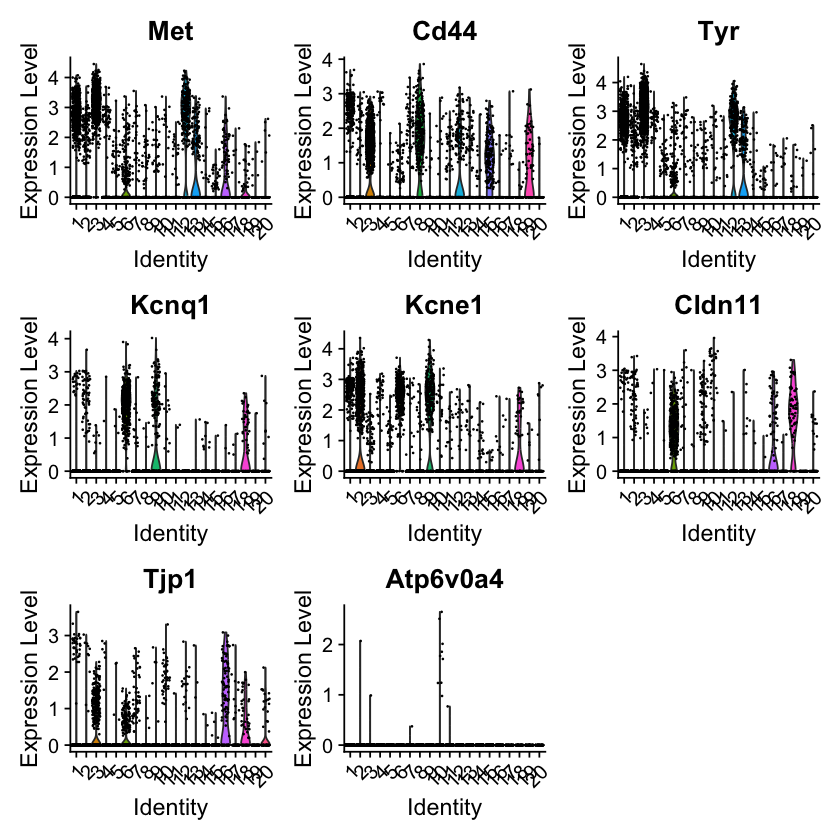

In [22]:
VlnPlot(PhexWT_1, features = c(IC_genes, MC_genes, BC_genes))

In [23]:
PhexWT_1.markers <- FindAllMarkers(PhexWT_1, only.pos = TRUE)
PhexWT_1.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1)

Calculating cluster 1

For a (much!) faster implementation of the Wilcoxon Rank Sum Test,
(default method for FindMarkers) please install the presto package
--------------------------------------------
install.packages('devtools')
devtools::install_github('immunogenomics/presto')
--------------------------------------------
After installation of presto, Seurat will automatically use the more 
efficient implementation (no further action necessary).
This message will be shown once per session

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.532268,0.801,0.627,0.000000e+00,1,Ifi27l2a
0.000000e+00,1.767658,0.981,0.877,0.000000e+00,1,Gsta4
0.000000e+00,1.300893,1.000,1.000,0.000000e+00,1,Fth1
2.439406e-236,1.375979,0.758,0.621,4.787822e-232,1,Selenop
1.883523e-138,1.180676,0.671,0.669,3.696790e-134,1,Aldoa
2.958156e-116,1.334682,0.565,0.428,5.805973e-112,1,Fxyd3
5.742670e-107,1.314117,0.597,0.560,1.127114e-102,1,Glul
2.456009e-93,1.500070,0.465,0.341,4.820409e-89,1,Mlana
2.630261e-89,1.750942,0.418,0.287,5.162414e-85,1,Gsta2


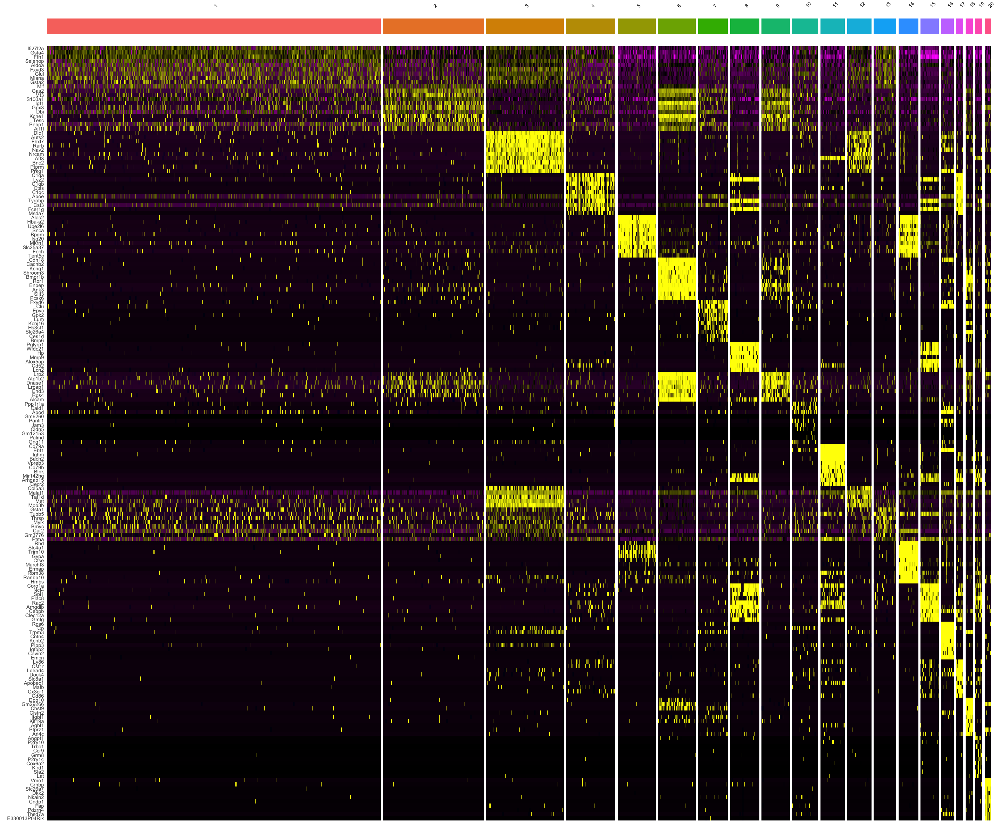

In [64]:
options(repr.plot.width = 24, repr.plot.height = 20)
PhexWT_1.markers %>%
    group_by(cluster) %>%
    dplyr::filter(avg_log2FC > 1) %>%
    slice_head(n = 10) %>%
    ungroup() -> top10
DoHeatmap(PhexWT_1, features = top10$gene, size = 3) + NoLegend() 

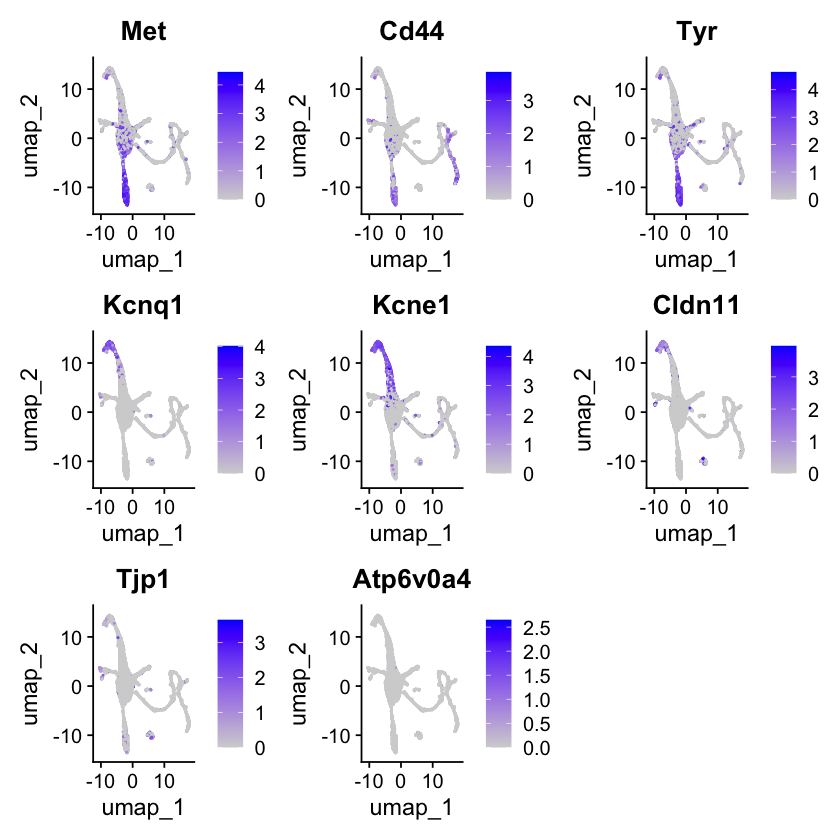

In [25]:
FeaturePlot(PhexWT_1, features = c(IC_genes, MC_genes, BC_genes))

In [26]:
mt_threshold <- 30

In [27]:
PhexWT_1$mt30 <- ifelse(FetchData(PhexWT_1, vars = "percent.mt") > mt_threshold, ">30", "<30")

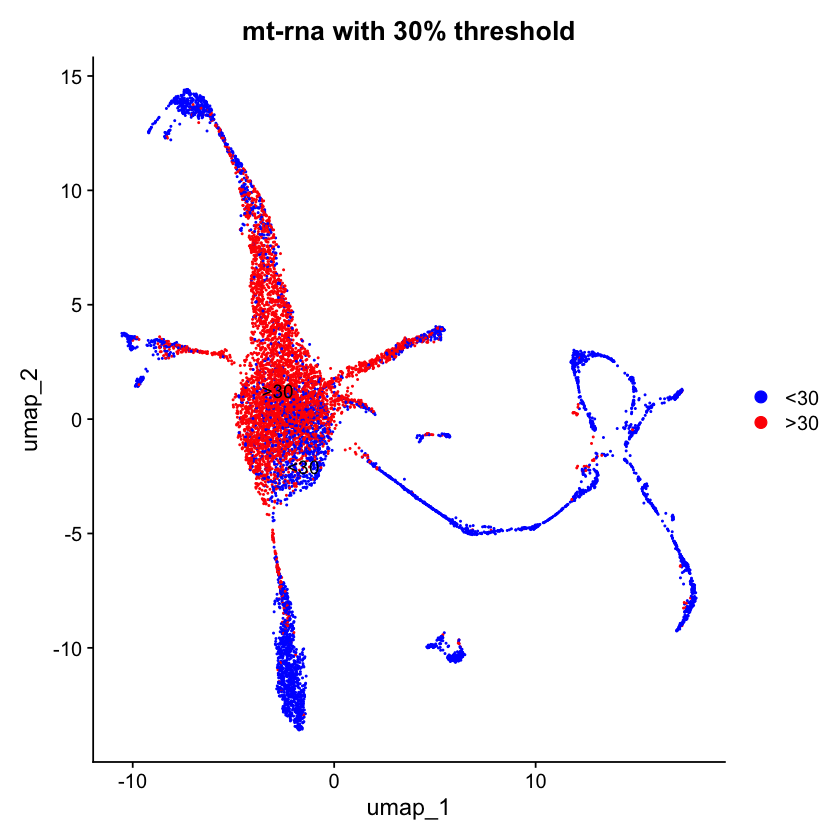

In [28]:
DimPlot(PhexWT_1, group.by = "mt30", label = TRUE, cols = c("blue", "red")) + 
  ggtitle("mt-rna with 30% threshold")

Warning message:
“The `slot` argument of `VlnPlot()` is deprecated as of Seurat 5.0.0.
ℹ Please use the `layer` argument instead.”


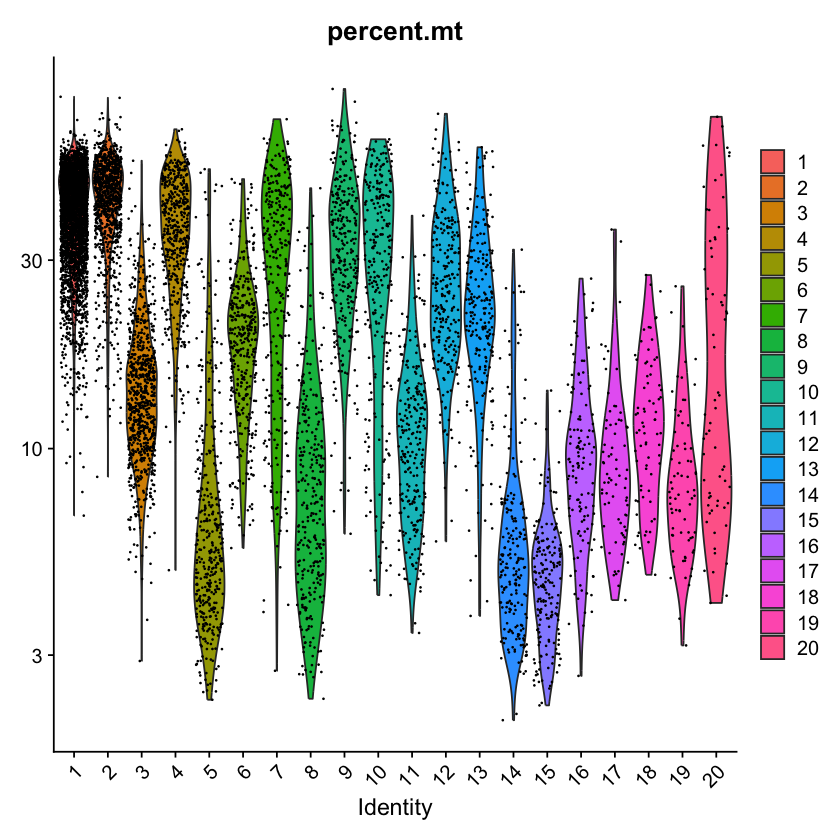

In [29]:
VlnPlot(PhexWT_1, features = c("percent.mt"), slot = "counts", log = TRUE)

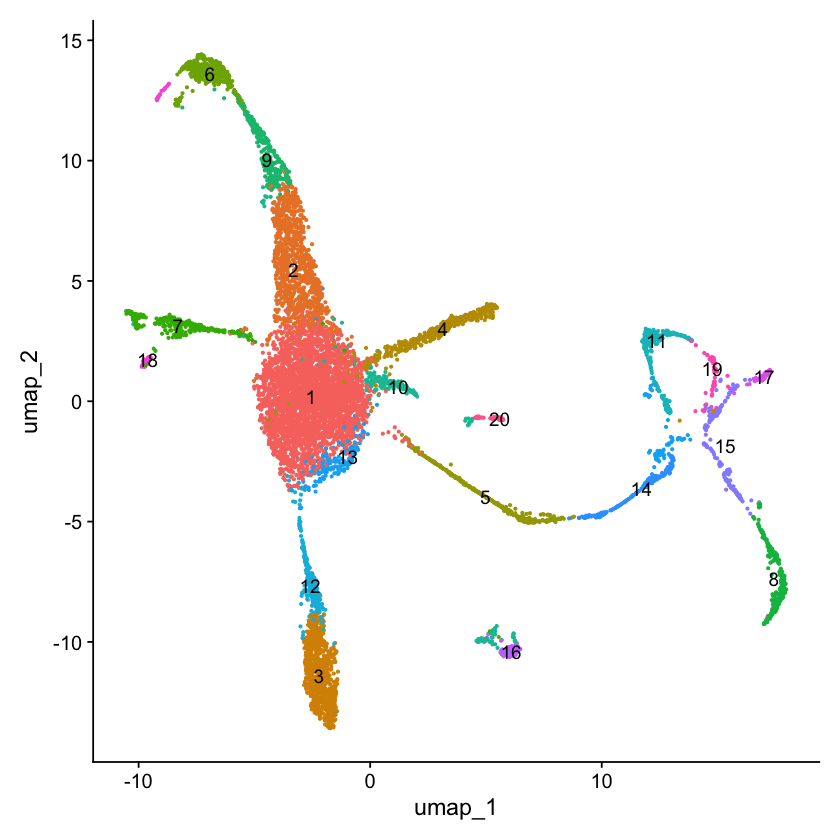

In [30]:
DimPlot(PhexWT_1, reduction = "umap", label = TRUE, pt.size = 0.5) + NoLegend()

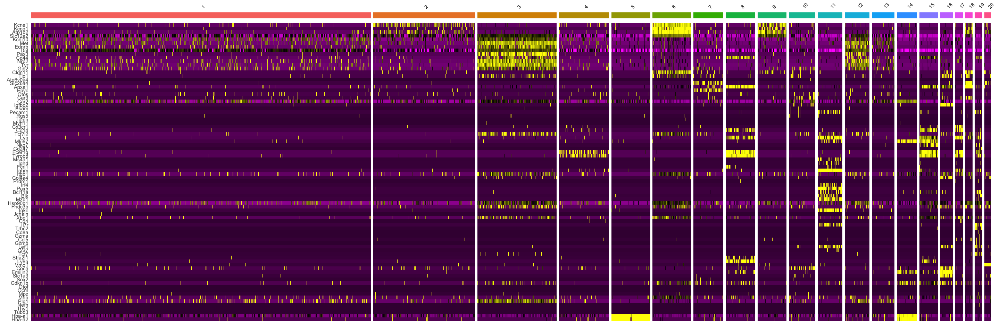

In [60]:
DoHeatmap(PhexWT_1, features = marker_genes, size = 3) + NoLegend() 

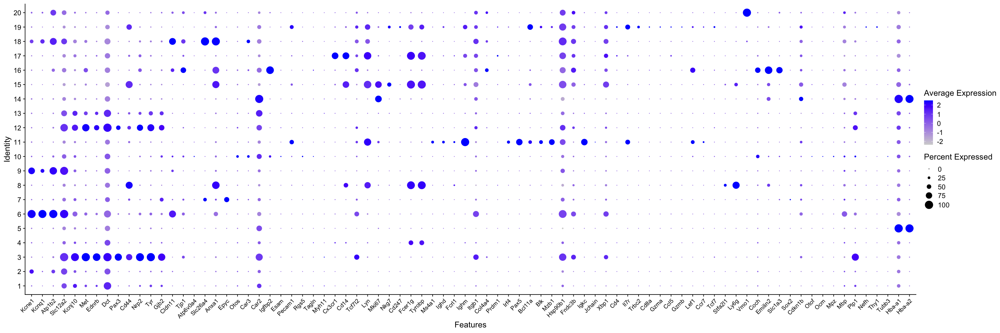

In [62]:
# Set plot dimensions in inches
options(repr.plot.width = 24, repr.plot.height = 8)

# Generate the plot with the new dimensions
marker_genes <- unique(marker_genes)
DotPlot(PhexWT_1, features = marker_genes) +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1, size = 10)
  )

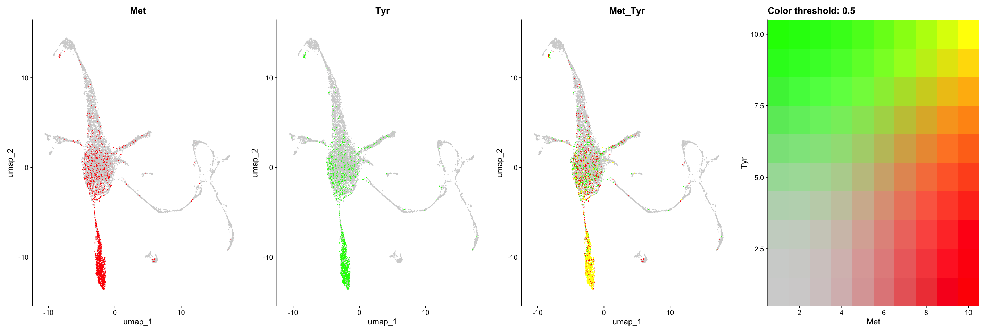

In [42]:
#IC Markers
FeaturePlot(PhexWT_1, features = c("Met", "Tyr"), blend = TRUE)

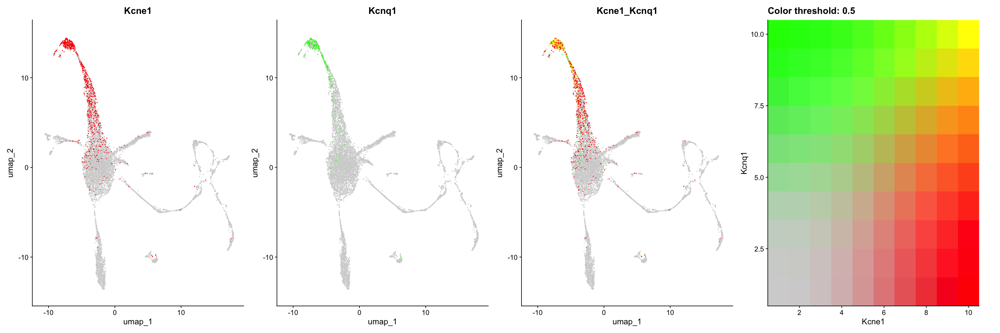

In [43]:
#MC markers
FeaturePlot(PhexWT_1, features = c("Kcne1", "Kcnq1"), blend = TRUE)

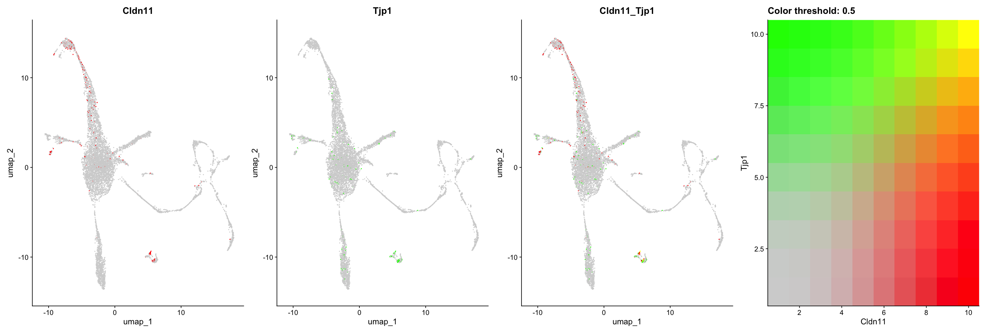

In [44]:
#BC markers
FeaturePlot(PhexWT_1, features = c("Cldn11", "Tjp1"), blend = TRUE)

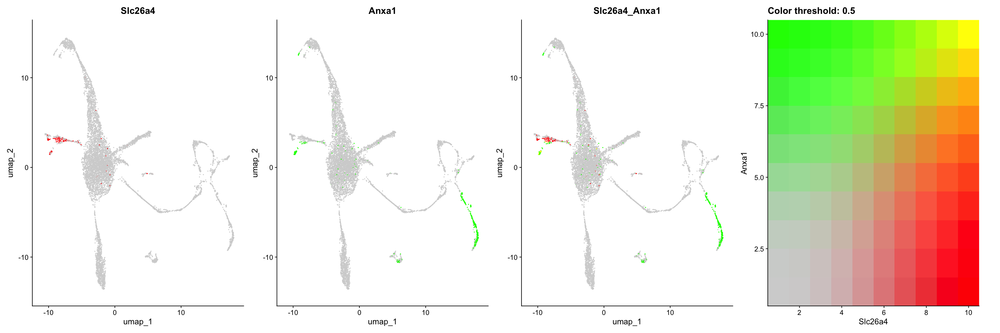

In [45]:
#SpC markers
FeaturePlot(PhexWT_1, features = c("Slc26a4", "Anxa1"), blend = TRUE)

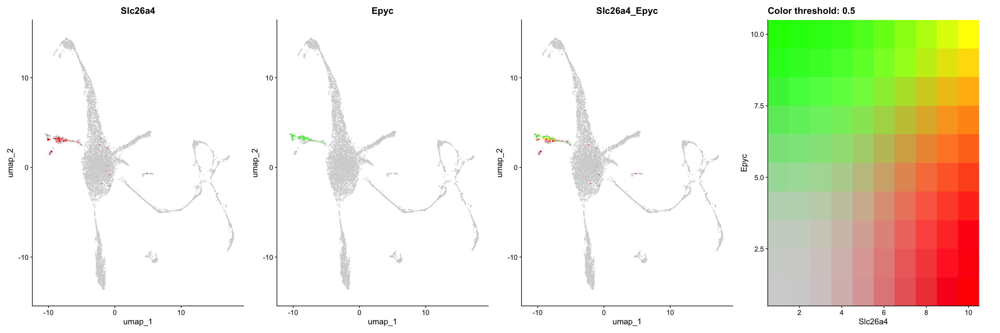

In [46]:
#RC markers
FeaturePlot(PhexWT_1, features = c("Slc26a4", "Epyc"), blend = TRUE)

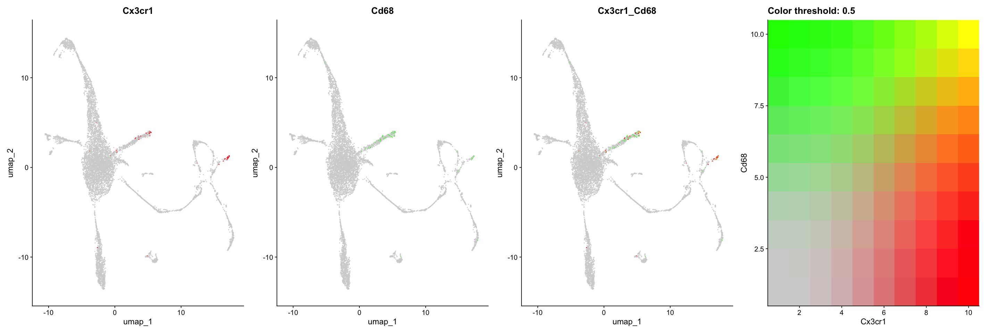

In [48]:
#MP markers
FeaturePlot(PhexWT_1, features = c("Cx3cr1", "Cd68"), blend = TRUE)

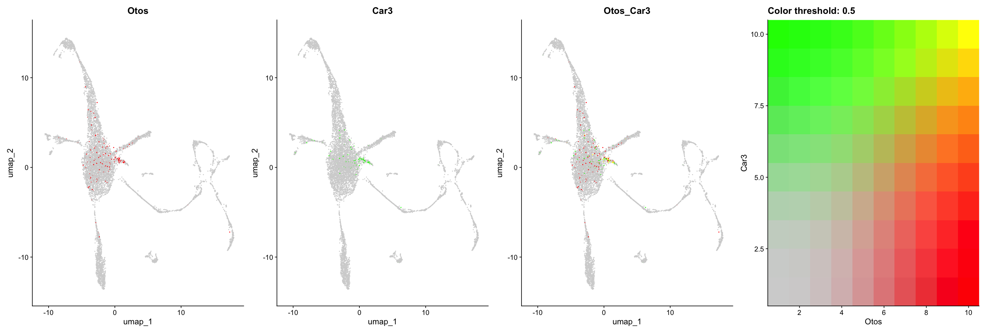

In [49]:
#Fibrocyte Markers
FeaturePlot(PhexWT_1, features = c("Otos", "Car3"), blend = TRUE)

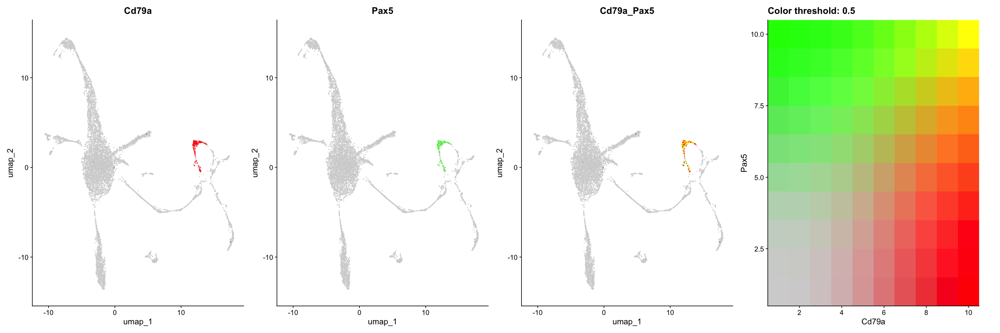

In [50]:
#B Cell markers
FeaturePlot(PhexWT_1, features = c("Cd79a", "Pax5"), blend = TRUE)

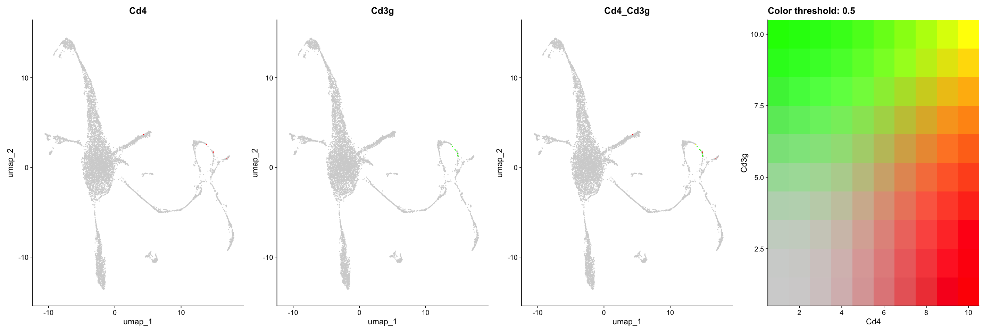

In [58]:
FeaturePlot(PhexWT_1, features = c("Cd4", "Cd3g"), blend = TRUE)

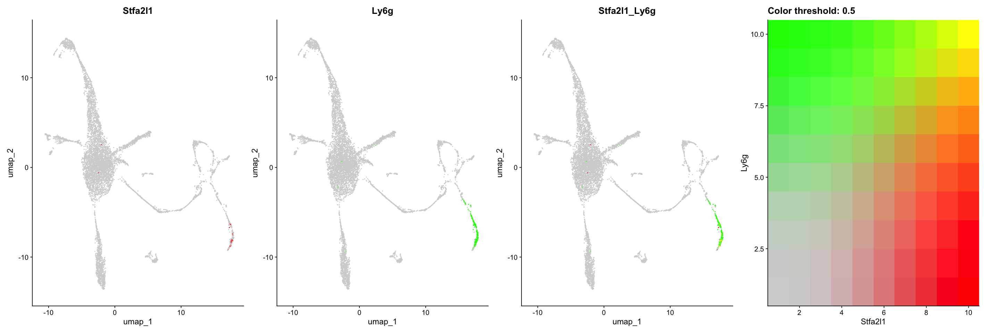

In [54]:
FeaturePlot(PhexWT_1, features = c("Stfa2l1", "Ly6g"), blend = TRUE)

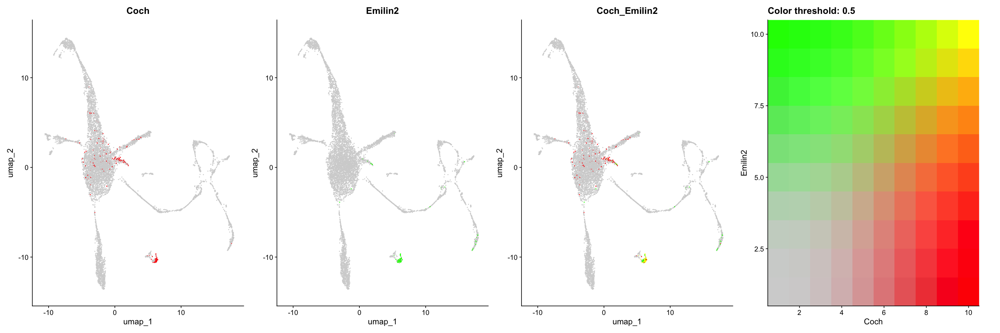

In [56]:
FeaturePlot(PhexWT_1, features = c("Coch", "Emilin2"), blend = TRUE)

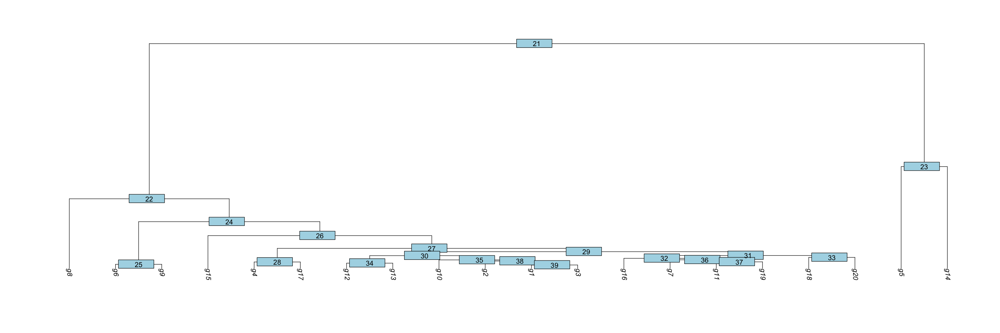

In [67]:
options(repr.plot.width = 24, repr.plot.height = 8)
# Build a cluster dendrogram
PhexWT_1 <- BuildClusterTree(PhexWT_1)
# Plot the dendrogram
PlotClusterTree(PhexWT_1)

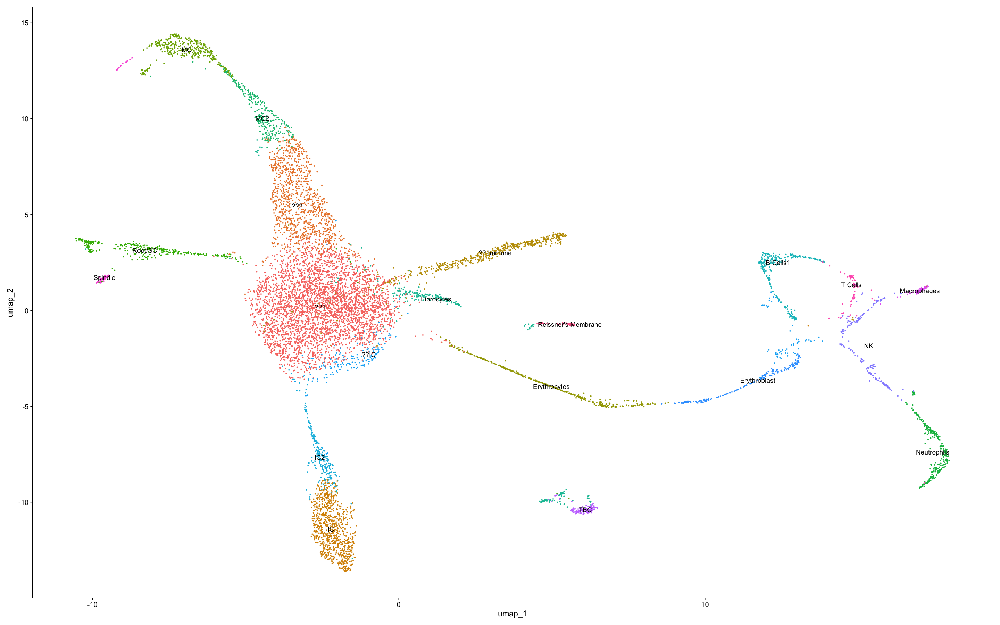

In [77]:
new.cluster.ids <- c("??1", "??2", "IC", "?? Immune", "Erythrocytes", "MC", "Root/SC", "Neutrophils", "MC2", "Fibrocytes", "B Cells1", "IC2", "??IC", "Erythroblast", "NK", "TBC", "Macrophages",
                    "Spindle", "T Cells", "Reissner's Membrane")
names(new.cluster.ids) <- levels(PhexWT_1)
PhexWT_1 <- RenameIdents(PhexWT_1, new.cluster.ids)
options(repr.plot.width = 24, repr.plot.height = 15)
DimPlot(PhexWT_1, reduction = "umap", label = TRUE, pt.size = 0.5) + NoLegend()

In [78]:
# Set renamed identities as the active identities
Idents(PhexWT_1) <- factor(Idents(PhexWT_1))

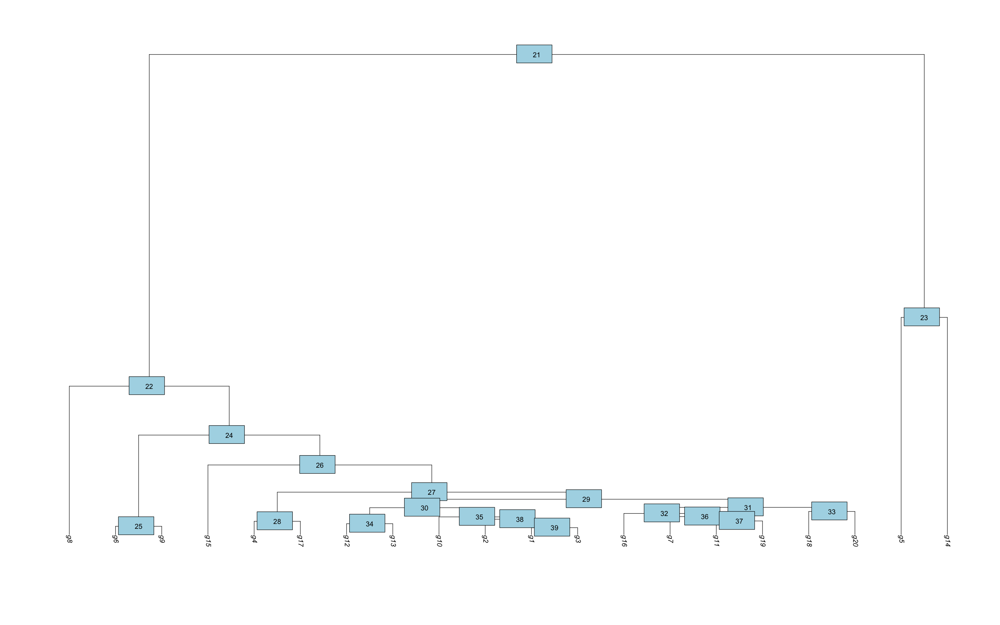

In [79]:
PlotClusterTree(PhexWT_1, label = TRUE)

In [81]:
install.packages("dendextend")  # Install if you don't have it
library(dendextend)

also installing the dependency ‘viridis’


Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done


---------------------
Welcome to dendextend version 1.18.1
Type citation('dendextend') for how to cite the package.

Type browseVignettes(package = 'dendextend') for the package vignette.
The github page is: https://github.com/talgalili/dendextend/

Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues
You may ask questions at stackoverflow, use the r and dendextend tags: 
	 https://stackoverflow.com/questions/tagged/dendextend

	To suppress this message use:  suppressPackageStartupMessages(library(dendextend))
---------------------



Attaching package: ‘dendextend’


The following object is masked from ‘package:stats’:

    cutree


